# **Advanced Lane Finding** 

In this project, I leverage several computer vision techniques to compute the angle and location of road lanes in a video and create an output video with those lanes marked.

This notebook will serve as my documentation, sample images, and finished project. 

## Calibrate Camera with Chessboard
The first step is to calibrate our camera. This is done to remove the distortion that lenses create and ensure that our lane finding algorithm could be generalized to different cameras.

We do this back by taking an image that our camera took of a chessboard and leveraging the cv2 findChessBoardCorners and calibrateCamera functions to get a camera matrix and distant coefficients. These can be used to undistort all future images from this camera. 

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import pickle
import glob
%matplotlib inline

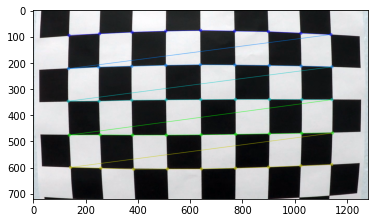

In [2]:
# prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 5#TODO: enter the number of inside corners in y

objpoints = []
imgpoints = []

objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)


# Make a list of calibration images
# img = mpimg.imread('resources/camera_cal/calibration1.jpg')
images = glob.glob('resources/camera_cal/*.jpg')

for idx, fname in enumerate(images):
    # Read in an image
    img = cv2.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

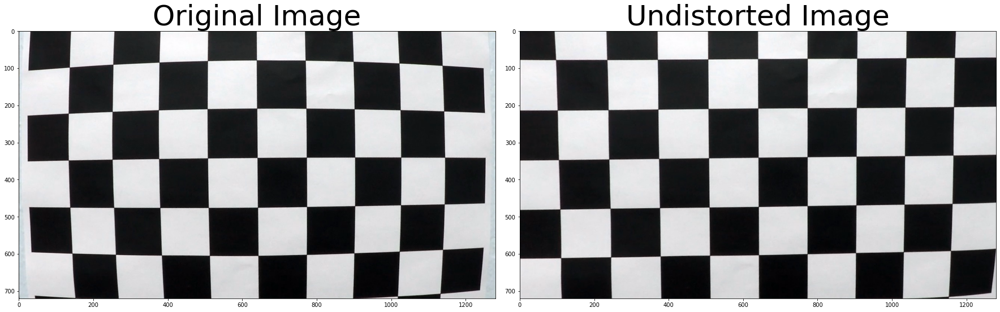

In [3]:
# Takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera and cv2.undistort()
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

# Get test image
img = cv2.imread('resources/camera_cal/calibration1.jpg')

undistorted, mtx, dist = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [4]:
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration_pickle.p", "wb" ) )

## Select test image

In [5]:
# Read in an image
img = mpimg.imread('resources/test_images/test_shadow.jpg')

## Define Plot Function
This function is used during the pipeline building process to show the difference between the original and procsessed images.

In [6]:
def plot_images(original, modified, title):
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(original)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(modified, cmap='gray')
    ax2.set_title(title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Use Calibrated Camera to Undistort Lane Images
Undistort leverages the camera matrix and distance coefficients that we calculated from the chessboard image to undistort any image we pass it.

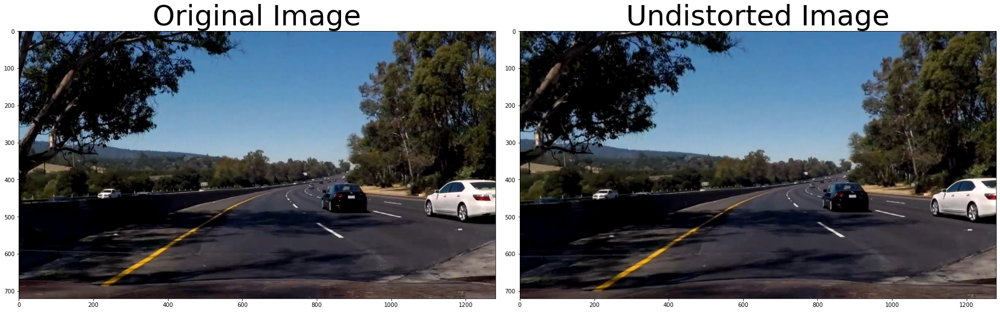

In [7]:
def undistort(img):
    #Load pickle
    dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]

    # Undistort sample image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted

# undistort it
undistorted = undistort(img)

# printing out some stats and plotting
plot_images(img, undistorted, 'Undistorted Image')

## Get Binary Image with Gradient
Our first iteration of computing a thresholded gradient of the road image is to apply the Sobel operator in the x direction to a greyscaled version of our image and finally compute the absolute value of the result. This isolates the gradients in the image and gives an image that we can use to isolate the lane lines.

Relying on absolute value has some limitations though. As you can see from the sample image, there is still a lot of noise within the lane.

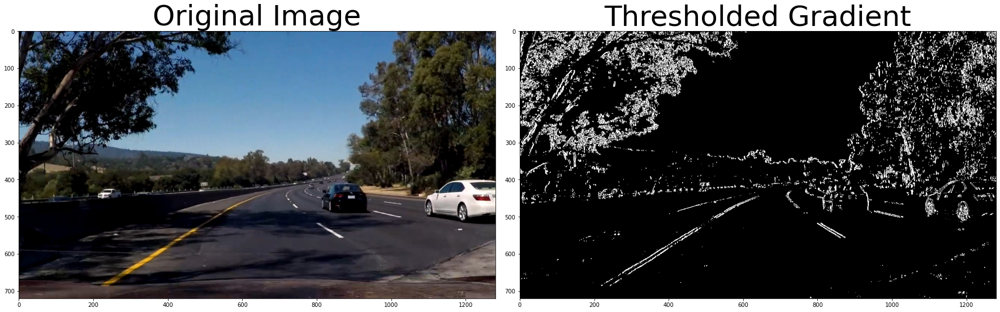

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sxbinary
    
# Run the function
grad_binary = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(20,100))
# Plot the result
plot_images(img, grad_binary, 'Thresholded Gradient')

## Gradient with magnitude
Next we try taking the maginute of the Sobel operator in both the x and y direction. By not relying too much on either directions, we're able to clear out much of the noise from the previous image. 

However, there are still some thick lines in the middle that could confuse our lane detector. You can also notice that both gradients fail to detect the yellow lane at all. We'll need to fix this if we want to be able to drive anywhere with yellow lanes (aka all most everywhere).

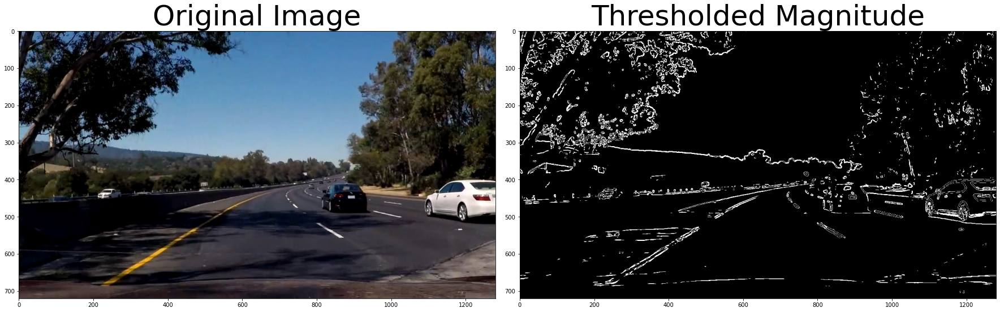

In [9]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    magnitude = np.sqrt(sobelx*sobelx + sobely*sobely)
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))
    # 6) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 7) Return this mask as your binary_output image
    return sxbinary
    
# Run the function
mag_binary = mag_thresh(img, sobel_kernel=7, mag_thresh=(50, 100))

# Plot the result
plot_images(img, mag_binary, 'Thresholded Magnitude')

## Gradient with direction
In order to detect those yellow lanes, we can compute the direction of the gradient as the arctangent of the gradient in the y direction divided by the gradient in the x direction. This is a much noisier gradient than our magnitude gradient, but it accurately captures the identical direction of the pixels from the yellow lane.

We have some tricks for removing the rest of the noise.

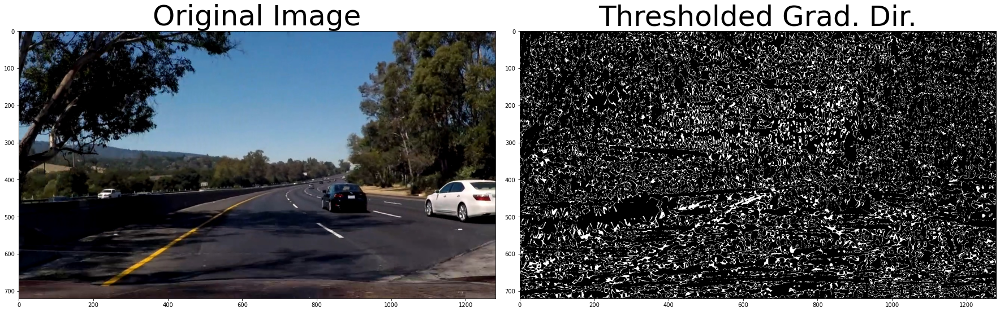

In [10]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    sbinary = np.zeros_like(direction)
    sbinary[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sbinary
    
# Run the function
dir_binary = dir_threshold(img, sobel_kernel=29, thresh=(1.1, 1.3))

# Plot the result
plot_images(img, dir_binary, 'Thresholded Grad. Dir.')

## Combining Thresholds
Now that we've isolated the white lanes with magnitude thresholding and the yellow lanes with direction thresholding, we can combine those images with base x/y sobel thresholds to get a result that captures both lanes.

Despite lengthy tweaking of the sobel kernel size and the thresholds for the various functions, I've been unable to remove the noise in the middle of the lane. Since the markings on this section of the road are a different color than the lanes, we should be able to remove them with another technique.

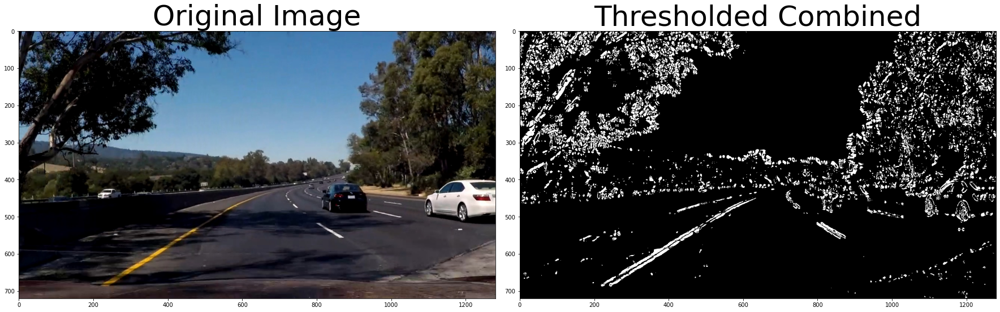

In [11]:
# Combined different thresholding techniques
def combined_thresh(img):
    # Choose a Sobel kernel size
    ksize = 21

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20,100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20,100))
    mag_binary = mag_thresh(img, sobel_kernel=7, mag_thresh=(50, 100))
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.4, 1.3))
    
    #Combine them
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) | (grady == 1)) & ((mag_binary == 1) | (dir_binary == 1))] = 1
    return combined
    
# Run the function
mag_combined = combined_thresh(img)

# Plot the result
plot_images(img, mag_combined, 'Thresholded Combined')

## Color Thresholding
In this step, we isolat the lightness and saturation channels of the color image and then take an absolute Sobel in the x direction of the lightness channel. Finally we compute a binary that activates a pixel if it's saturated pixel is within the hardcoded threshold OR if it's scaled Sobel pixel of the lightness channel is within a separate hardcoded threshold.

After extensive trial and error with these thresholds, I was able to get ranges that effectively isolate the lanes in a variety of images.

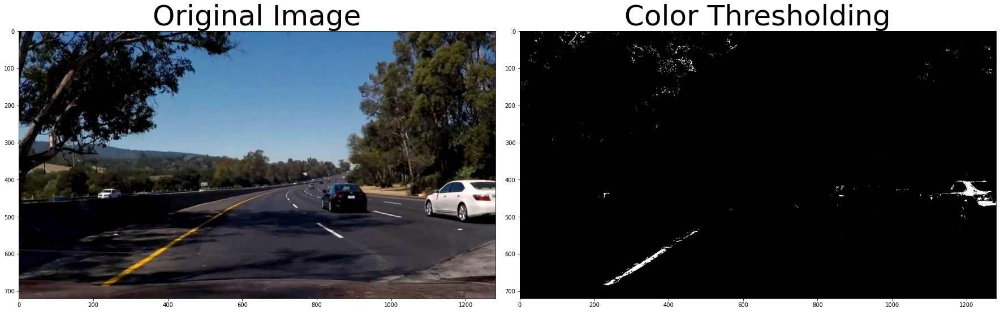

In [12]:
# Edit this function to create your own pipeline.
def color_thresh(img, s_thresh=(170, 255), l_thresh=(30, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Threshold x gradient and color
    color_gradient_binary = np.zeros_like(s_channel)
    color_gradient_binary[((s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])) & ((l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1]))] = 1
    return color_gradient_binary
    
result = color_thresh(img)

# Plot the result
plot_images(img, result, 'Color Thresholding')

## Combine Color and Gradient Thresholding


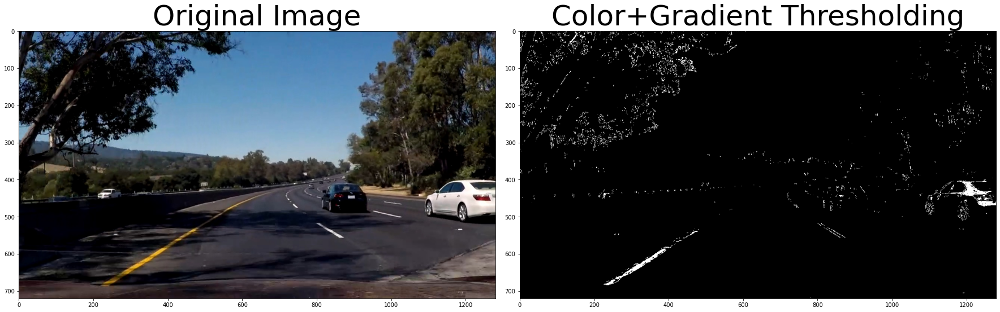

In [13]:
# Edit this function to create your own pipeline.
def color_gradient_thresh(img, s_thresh=(170, 255), l_thresh=(30, 255), sx_thresh=(65, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient and color
    color_gradient_binary = np.zeros_like(s_channel)
    color_gradient_binary[((s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])) & ((l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])) | ((scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1]))] = 1
    return color_gradient_binary
    
result = color_gradient_thresh(img)

# Plot the result
plot_images(img, result, 'Color+Gradient Thresholding')

## Build Bounding Box for Perspective Transform
In order to find the correct points for the bounding box that I use in the perspective transform step, I tried drawing the box onto an image of a moderately straight section of highway. My goal was to capture all of the lane, but not get too close to the horizon as that tended to result in lane confusion on exceptionally curvy highway images.

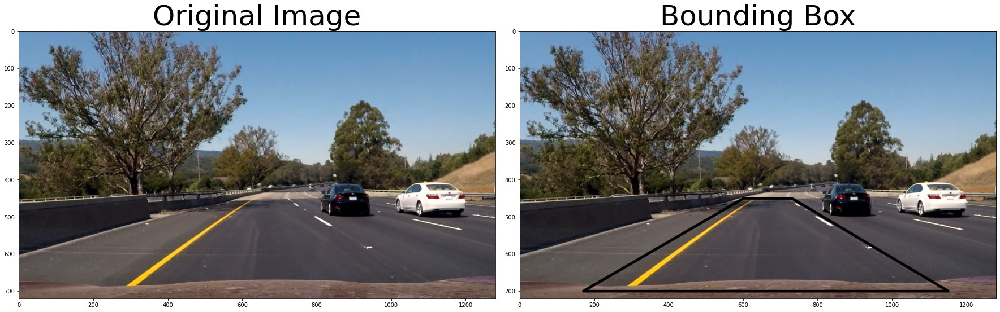

In [14]:
test_img = mpimg.imread('resources/test_images/test6.jpg')
points = [(600, 450), (730,450), (1150, 700), (170, 700)]
cv2.line(test_img, points[0], points[1], 0, 5)
cv2.line(test_img, points[1], points[2], 0, 5)
cv2.line(test_img, points[2], points[3], 0, 5)
cv2.line(test_img, points[3], points[0], 0, 5)
plot_images(mpimg.imread('resources/test_images/test6.jpg'), test_img, "Bounding Box")

## Apply Perspective Transform
Next, I use this bounding box to compute a perspective transformed (or "bird's eye view") version of the road image. This was one of the more challenging aspects of the project. I wanted to get a more accurate transform than I currently have, but I realized that my lane detection could still be accurate with an imperfect transform.

While working on this aspect of the pipeline, I found it helpful to compute the transform on a collection of sample images. The transform works pretty well on straight roads, but fails to transform curvy road segments accurately.

Given more time, I would use other computer vision techniques to compute the bounding box dynamically. For instance, I could use Hough lines to get a rough estimate of the lane location and horizon for computing a bounding box that adjusts for different images.

C:\Users\smhrd\AppData\Local\Temp\ipykernel_10344\132030369.py:48: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


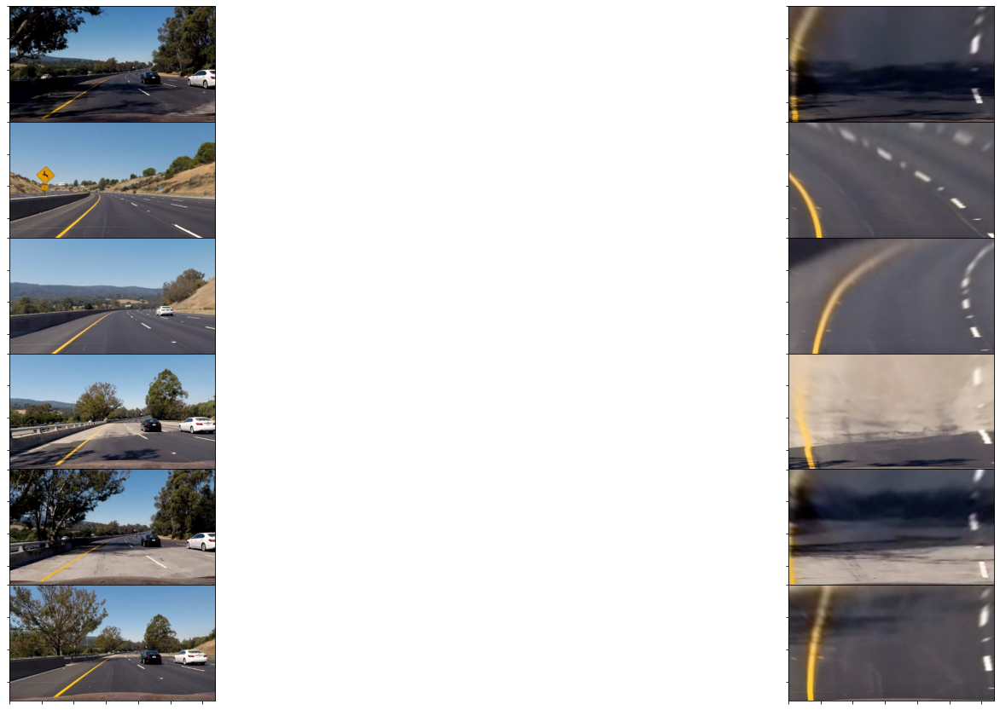

In [15]:
def perspective_transform(img, mtx, dist, isColor=True):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    if(isColor):
        # Convert undistorted image to grayscale
        gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    else:
        gray = undist

    xoffset = 0 # offset for dst points
    yoffset = 0
    img_size = (undist.shape[1], undist.shape[0])

    src = np.float32([(600, 450), (730,450), (1150, 700), (170, 700)])
    dst = np.float32([[xoffset, yoffset], [img_size[0]-xoffset, yoffset], 
                                 [img_size[0]-xoffset, img_size[1]-yoffset], 
                                 [xoffset, img_size[1]-yoffset]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

               
#Load pickle
dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
                         
# Run the function
images = ['test_shadow.jpg','test2.jpg','test3.jpg','test4.jpg','test5.jpg','test6.jpg']
f, axarr = plt.subplots(6, 2, figsize=(30, 15))
for i in range(len(images)):
    cur_img = mpimg.imread('resources/test_images/' + images[i])
    cur_img = undistort(cur_img)
    transformed, M = perspective_transform(cur_img, mtx, dist)
    axarr[i,0].imshow(cur_img)
    axarr[i,1].imshow(transformed, cmap='gray')
    plt.setp(axarr[i,0].get_yticklabels(), visible=False)
    plt.setp(axarr[i,0].get_xticklabels(), visible=False)
    plt.setp(axarr[i,1].get_yticklabels(), visible=False)
    plt.setp(axarr[i,1].get_xticklabels(), visible=False)

f.subplots_adjust(hspace=0)
f.show()

## Pipeline with everything
Next I combine the three techniques of camera undistoration, color/gradient thresholding, and perspective transform to compute an approximately bird's eye view image with the lane pixels roughly isolated.

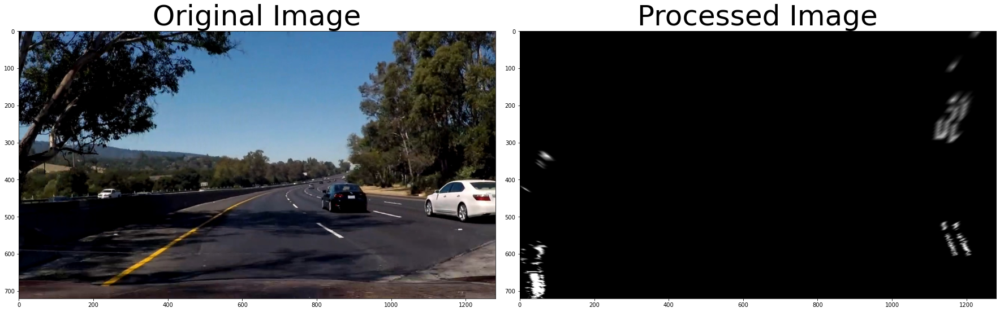

In [16]:
from scipy.signal import argrelextrema

def process_image(img):
    # undistort it
    img = undistort(img)
    
    # Apply thresholded gradient
    img = color_gradient_thresh(img)
    
    #Apply perspective transform
    img, M = perspective_transform(img, mtx, dist, isColor=False)
    return img, M
                                
# Run the function
processed_img, M = process_image(img)
    
# Plot the result
plot_images(img, processed_img, 'Processed Image')

## Plot fit line and calculate curvature
The bulk of the project is this step of taking a top-down image with the lane lines isolated and computing polynomials that fit to the left and right lane lines. 

These are the steps that I take to do this:
1. Divide image in half vertically and use the bottom quarter of each image to find the x coordinate with the most white pixels in it. These coordinates will be used as the estimate for the left and right lanes' starting position.
2. Iterate through vertical segments of the image (starting from the bottom and moving up), detecting the most activated x-coordinate in each segment and appending to lists for the left and right lanes. Also, keep track of the y-position for each of these vertical segments.
3. Leverage the lists of x and y positions for the two lanes and the numpy polyfit function to get a second-order polynomial that fits the points we detected.
4. Use these polynomials to compute the radius of curvature.

This process is fairly reliable and inaccuracies in the starting position or shape of the polynomial can generally be traced to inaccurate input images.

Left fit:  [50.3013834  48.493083   46.98418972 45.77470356 44.86462451 44.25395257
 43.94268775 43.93083004 44.21837945 44.80533597 45.6916996  46.87747036
 48.36264822 50.1472332  52.2312253  54.61462451 57.29743083 60.27964427
 63.56126482 67.14229249 71.02272727 75.20256917]
Right rit:  [1176.91304348 1170.73913043 1165.16657256 1160.19536985 1155.8255223
 1152.05702993 1148.88989272 1146.32411067 1144.35968379 1142.99661208
 1142.23489554 1142.07453416 1142.51552795 1143.55787691 1145.20158103
 1147.44664032 1150.29305477 1153.74082439 1157.78994918 1162.44042914
 1167.69226426 1173.54545455]
Left curvature:  685.7345584805338
Right curvature:  341.92084443801014


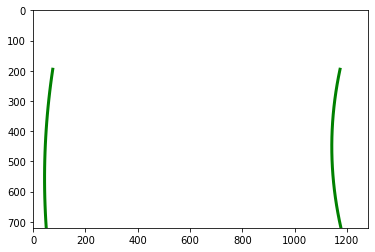

In [21]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def getCurvatureForLanes(processed_img, prev_left_fitx, prev_right_fitx, prev_left_peak, prev_right_peak):
    yvals = []
    leftx = []
    rightx = []
    imageHeight = processed_img.shape[0]
    imageWidth = processed_img.shape[1]
    bufferForDecidingByDistanceFromMid = 10

    left_histogram = np.sum(processed_img[(imageHeight//4):,:(imageWidth//2)], axis=0)   
    right_histogram = np.sum(processed_img[(imageHeight//4):,(imageWidth//2):], axis=0)

    # get local maxima
    starting_left_peak = np.argmax(left_histogram)
    leftx.append(starting_left_peak)
    
    starting_right_peak = np.argmax(right_histogram)
    rightx.append(starting_right_peak + imageWidth//2)

    curH = imageHeight
    yvals.append(curH)
    increment = 25
    columnWidth = 150
    leftI = 0
    rightI = 0
    while (curH - increment >= imageHeight/4):
        curH =  curH - increment
        leftCenter = leftx[leftI]
        leftI += 1
        rightCenter = rightx[rightI]
        rightI += 1

        # calculate left and right index of each column
        leftColumnL = max((leftCenter - columnWidth//2), 0)
        rightColumnL = min((leftCenter + columnWidth//2), imageWidth)

        leftColumnR = max((rightCenter - columnWidth//2), 0)
        rightColumnR = min((rightCenter + columnWidth//2), imageWidth)

        # imageHeight/2 - (imageHeight - curH)
        leftHistogram = np.sum(processed_img[curH - increment:curH,leftColumnL:rightColumnL], axis=0)
        rightHistogram = np.sum(processed_img[curH - increment:curH,leftColumnR:rightColumnR], axis=0)

        left_peak = np.argmax(leftHistogram)
        right_peak = np.argmax(rightHistogram)
        if(left_peak):
            leftx.append(left_peak+leftColumnL)
        else:
            leftx.append(leftx[leftI-1])

        if(right_peak):
            rightx.append(right_peak+leftColumnR)
        else:
            rightx.append(rightx[rightI-1])
        yvals.append(curH)

    yvals = np.array(yvals)
    rightx = np.array(rightx)
    leftx = np.array(leftx)
    
    # Determine the fit in real space
    left_fit_cr = np.polyfit(yvals*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(yvals*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    y_eval = np.max(yvals)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])

    # Fit a second order polynomial to each lane line
    left_fit = np.polyfit(yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
        
    return left_curverad, right_curverad, left_fitx, right_fitx, yvals, starting_right_peak, starting_left_peak

left_curverad, right_curverad, left_fitx, right_fitx, yvals, right_peak, left_peak = getCurvatureForLanes(processed_img, [], [], [], [])

# Plot the two lines
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, yvals, color='green', linewidth=3)
plt.plot(right_fitx, yvals, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

print("Left fit: ", left_fitx)
print("Right rit: ", right_fitx)
print("Left curvature: ", left_curverad)
print("Right curvature: ", right_curverad)

## Plot lane area and warp back to original image
Once we've computed the fit polynomial for the left and right lanes, we can use it in conjuction with y values from the vertical segments that we iterated through to plot a fill space on the image, highlighting the lane.

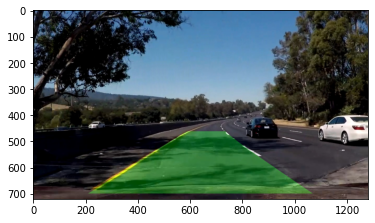

In [22]:
from numpy.linalg import inv

def drawLane(warped, M, undist, left_fitx, right_fitx, yvals):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = inv(M)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    return cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

result = drawLane(processed_img, M, img, left_fitx, right_fitx, yvals)
plt.imshow(result)

## Draw Lane Curvature and Distance From Center¶
In this step we add some text to the image with the lane's curvature and the estimated distance of the car from the center of the lane (in pixels).

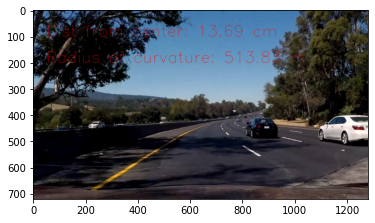

In [23]:
def averageWithPrevious(stat, previousStats, nToAverage):
    if(len(previousStats) == 0):
        return stat
    if(nToAverage > len(previousStats)):
        nToAverage = len(previousStats)
    for i in range(len(previousStats)-nToAverage, len(previousStats)):
        stat = stat + previousStats[i]
    return stat/(nToAverage + 1)

def drawCurvatureAndDistanceFromCenter(img, right_peak, left_peak, left_curverad, right_curverad, right_peak_list, left_peak_list, left_curverad_list, right_curverad_list, nToAverage):
    # Represents typical offset, I suspect related to camera placement
    lane_offset = 50.0
    right_peak = averageWithPrevious(right_peak, right_peak_list, nToAverage)
    left_peak = averageWithPrevious(left_peak, left_peak_list, nToAverage)
    left_curverad = averageWithPrevious(left_curverad, left_curverad_list, nToAverage)
    right_curverad = averageWithPrevious(right_curverad, right_curverad_list, nToAverage)
    radius_of_curvature = "%.2f" % ((left_curverad + right_curverad)/2)
    image_center = img.shape[1]/2
    lane_center = (right_peak - left_peak)/2 + right_peak
    distance_from_center = "%.2f" % (np.abs((image_center - lane_center)*xm_per_pix*100 + lane_offset))
    cv2.putText(img,"Dist from center: " + str(distance_from_center) + " cm", (50,100), cv2.FONT_HERSHEY_SIMPLEX, 2, 255, 0, 30)
    cv2.putText(img,"Radius of curvature: " + str(radius_of_curvature) + " m", (50,200), cv2.FONT_HERSHEY_SIMPLEX, 2, 255, 0, 30)
    return img

img = mpimg.imread('resources/test_images/test_shadow.jpg')
result = drawCurvatureAndDistanceFromCenter(img, right_peak, left_peak, left_curverad, right_curverad, [], [], [], [], 5)
plt.imshow(result)

## Pipeline to draw lane on original image
Finally, I put all the techniques together in one function that takes in an image and drives the lane on it. I use global variables to cache the previous calculations for the lane polynomials and starting positions. Then I average the output calculation over the previous 5 frames. This was effective in drastically reducing the jumpiness that the videos exhibited before applying the smoothing.

C:\Users\smhrd\AppData\Local\Temp\ipykernel_10344\761466016.py:73: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


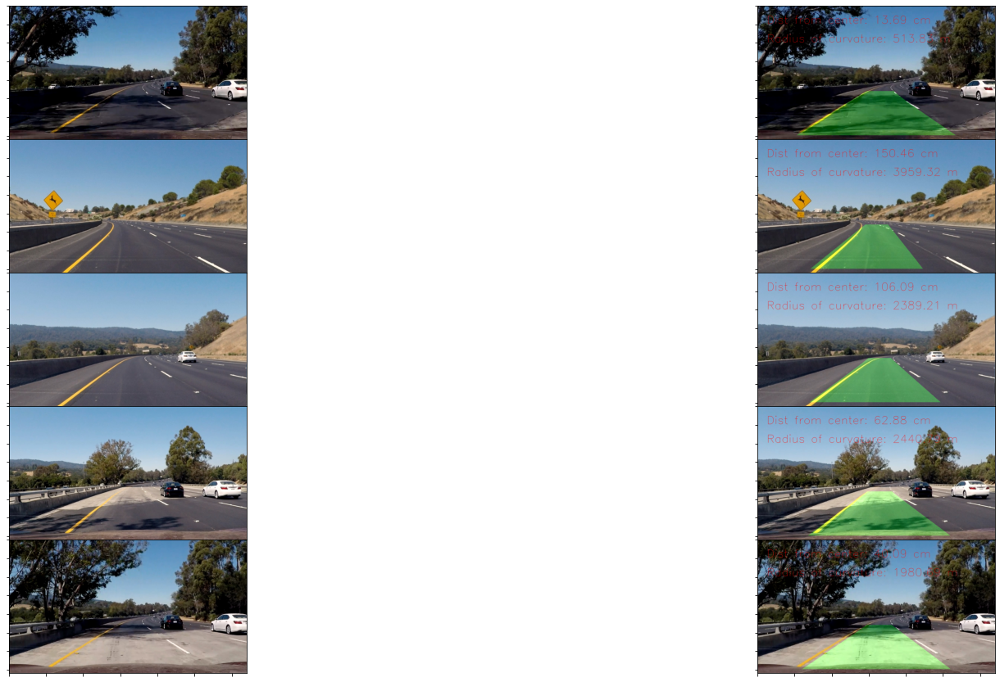

In [24]:
import copy

def averageWithPrevious(stat, previousStats, nToAverage):
    if(len(previousStats) == 0):
        return stat
    if(nToAverage > len(previousStats)):
        nToAverage = len(previousStats)
    for i in range(len(previousStats)-nToAverage, len(previousStats)):
        stat = stat + previousStats[i]
    return stat/(nToAverage + 1)

left_fitx_list = []
right_fitx_list = []
left_peak_list = []
right_peak_list = []
left_curverad_list = []
right_curverad_list = []
def draw_lanes(img):
    global left_fitx_list
    global right_fitx_list
    global left_peak_list
    global right_peak_list
    global left_curverad_list
    global right_curverad_list
    #save original
    original_img = copy.deepcopy(img)
    
    # undistort it
    img = undistort(img)
    
    # Apply thresholded gradient
    img = color_gradient_thresh(img)
    
    # Apply perspective transform
    processed_img, M = perspective_transform(img, mtx, dist, isColor=False)
    
    # Get lane definition
    left_curverad, right_curverad, left_fitx, right_fitx, yvals, right_peak, left_peak = getCurvatureForLanes(processed_img, left_fitx_list, right_fitx_list, left_peak_list, right_peak_list)
    
    # Update global lists 
    left_fitx_list.append(left_fitx)
    right_fitx_list.append(right_fitx)
    left_peak_list.append(left_peak)
    right_peak_list.append(right_peak)
    left_curverad_list.append(left_curverad)
    right_curverad_list.append(right_curverad)
            
    # Average across previous values
    n = 10
    right_peak = averageWithPrevious(right_peak, right_peak_list, n)
    left_peak = averageWithPrevious(left_peak, left_peak_list, n)
    right_fitx = averageWithPrevious(right_fitx, right_fitx_list, n)
    left_fitx = averageWithPrevious(left_fitx, left_fitx_list, n)
    
    # Draw on original image
    img = drawLane(processed_img, M, original_img, left_fitx, right_fitx, yvals)
    img = drawCurvatureAndDistanceFromCenter(img, right_peak, left_peak, left_curverad, right_curverad, right_peak_list, left_peak_list, left_curverad_list, right_curverad_list, n)
    return img

# Run the function
images = ['test_shadow.jpg','test2.jpg','test3.jpg','test4.jpg','test5.jpg']
f, axarr = plt.subplots(5, 2, figsize=(30, 15))
for i in range(len(images)):
    img = mpimg.imread('resources/test_images/' + images[i])
    img_with_lanes = draw_lanes(img)
    axarr[i,0].imshow(img)
    axarr[i,1].imshow(img_with_lanes, cmap='gray')
plt.setp([a.get_xticklabels() for a in axarr[:, 1]], visible=False)
plt.setp([a.get_yticklabels() for a in axarr[:, 1]], visible=False)
plt.setp([a.get_xticklabels() for a in axarr[:, 0]], visible=False)
plt.setp([a.get_yticklabels() for a in axarr[:, 0]], visible=False)
f.subplots_adjust(hspace=0)
f.show()

## Test on same image
In order to quickly tweak the caching functionality, I tested by repeating the lane drawing function on a list of images (rather than processing an entire video each time).

C:\Users\smhrd\AppData\Local\Temp\ipykernel_10344\658106867.py:17: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


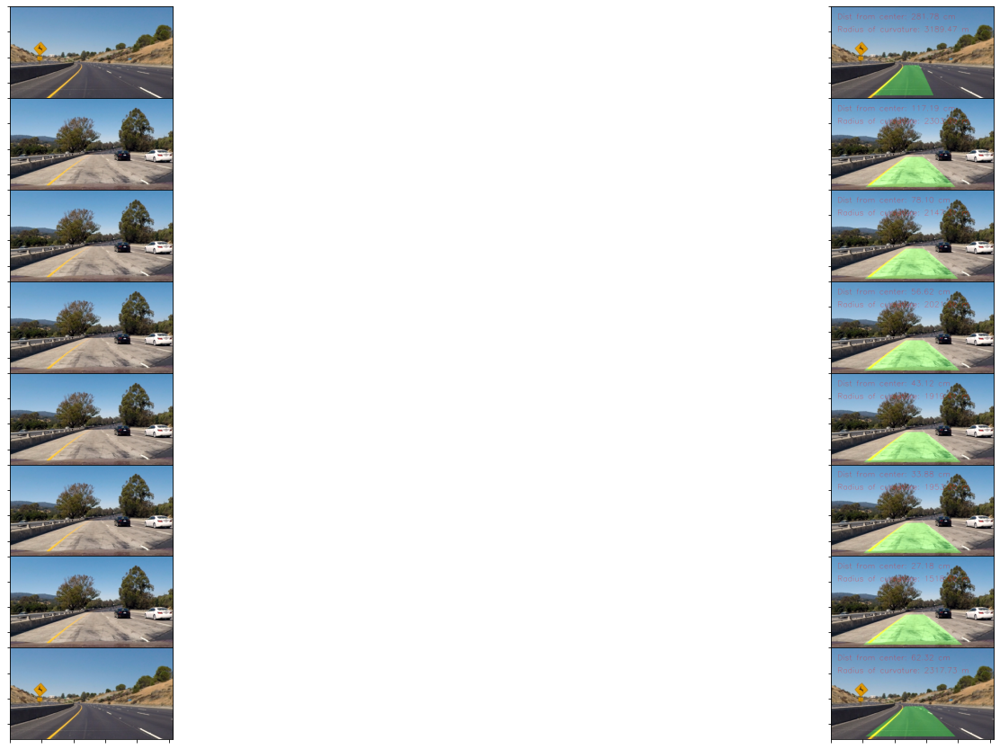

In [25]:
left_fitx_list = []
right_fitx_list = []
left_peak_list = []
right_peak_list = []
images = ['test2.jpg','test1.jpg','test1.jpg','test1.jpg','test1.jpg','test1.jpg','test1.jpg','test2.jpg']
f, axarr = plt.subplots(8, 2, figsize=(30, 15))
for i in range(8):
    img = mpimg.imread('resources/test_images/' + images[i])
    img_with_lanes = draw_lanes(img)
    axarr[i,0].imshow(img)
    axarr[i,1].imshow(img_with_lanes, cmap='gray')
plt.setp([a.get_xticklabels() for a in axarr[:, 1]], visible=False)
plt.setp([a.get_yticklabels() for a in axarr[:, 1]], visible=False)
plt.setp([a.get_xticklabels() for a in axarr[:, 0]], visible=False)
plt.setp([a.get_yticklabels() for a in axarr[:, 0]], visible=False)
f.subplots_adjust(hspace=0)
f.show()

## Apply Pipeline to Video
Using the pipeline draw_lanes function, I'm able to process an entire video, drawing lanes on each frame

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [28]:
for i in range(1,6):

  left_fitx_list = []
  right_fitx_list = []
  left_peak_list = []
  right_peak_list = []
  white_output = f'resources/블박{i}_output.mp4'
  clip1 = VideoFileClip(f"resources/블박{i}.mp4")
  white_clip = clip1.fl_image(draw_lanes) #NOTE: this function expects color images!!
  %time white_clip.write_videofile(white_output, audio=False)

  HTML("""
  <video width="960" height="540" cocntrols>
    <source src="{0}">
  </video>
  """.format(white_output))

Moviepy - Building video resources/블박1_output.mp4.
Moviepy - Writing video resources/블박1_output.mp4



Moviepy - Done !
Moviepy - video ready resources/블박1_output.mp4
CPU times: total: 9min 37s
Wall time: 2min 32s
Moviepy - Building video resources/블박2_output.mp4.
Moviepy - Writing video resources/블박2_output.mp4



Moviepy - Done !
Moviepy - video ready resources/블박2_output.mp4
CPU times: total: 2min 12s
Wall time: 33.8 s
Moviepy - Building video resources/블박3_output.mp4.
Moviepy - Writing video resources/블박3_output.mp4



Moviepy - Done !
Moviepy - video ready resources/블박3_output.mp4
CPU times: total: 2min 15s
Wall time: 34.4 s
Moviepy - Building video resources/블박4_output.mp4.
Moviepy - Writing video resources/블박4_output.mp4



Moviepy - Done !
Moviepy - video ready resources/블박4_output.mp4
CPU times: total: 2min 26s
Wall time: 37.3 s
Moviepy - Building video resources/블박5_output.mp4.
Moviepy - Writing video resources/블박5_output.mp4



Moviepy - Done !
Moviepy - video ready resources/블박5_output.mp4
CPU times: total: 15.3 s
Wall time: 4.02 s


## Reflections

This project was able to make steady, gradual process by breaking each step of the pipeline into a separate function and slowly iterating on each one. 

One of the key opportunities for improvement would be to apply a minimum threshold for lane detection when building my polynomial. For instance, if I'm processing an image where the left lane has very little white pixels at all, I'd automatically calculate that and just reuse the lane polynomial from the previous frame.

There are still some limitations on the gradient itself. Occasionally it will detect creases in the road (left from construction) as lane lines. I could probably reduce the impact of this be enforcing a certain lane width and rejecting any lane estimates that fall outside of that width.

This was a very interesting project and I enjoyed learning the nuances of the producing the lane polynomial. The end product was pretty satisfying too as it looks much smoother than the original project with rough lane estimates.